**Mount The Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Unzip the Folder from the drive**

In [ ]:
!unzip '/content/drive/MyDrive/Copy of PlantVillage - Copy.zip'

Streaming output truncated to the last 5000 lines.
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/7515d9e0-f3a4-4a49-9d6a-77cfa40a16a4___GCREC_Bact.Sp 3655.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/75348d38-1c41-4798-89c9-b99660d937ef___GCREC_Bact.Sp 5602.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/754dfec2-60c1-4848-803c-21ab8471014e___GCREC_Bact.Sp 3212.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/75702024-ade9-4eac-b531-77da04d236ee___GCREC_Bact.Sp 6070.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/75801778-ca08-4e6c-a209-a5eb74564929___GCREC_Bact.Sp 6390.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/758e3939-df9b-4595-afa5-4224f8c5b94c___GCREC_Bact.Sp 6035.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/759331b9-f9ad-4bb7-9870-6cd3a8b84913___GCREC_Bact.Sp 5561.JPG  
  inflating: PlantVillage - Copy/train/Tomato_Bacterial_spot/759ba7d2-9535

**Uploading n Resizing..**

In [ ]:
import os
import zipfile
from PIL import Image
from IPython.display import display



# Define the path to the zip file
zip_file_path = '/content/drive/MyDrive/Copy of PlantVillage - Copy.zip'  # Update with your zip file path

# Define the path to the folder where you want to save the resized images
output_folder = '/content/resized_images/'  # Update with your desired output folder path
os.makedirs(output_folder, exist_ok=True)

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(output_folder)

# Function to resize an image and display it
def resize_and_display_image(input_path, size=(128, 128)):
    try:
        image = Image.open(input_path)
        resized_image = image.resize(size, Image.ANTIALIAS)
        # display(resized_image)
    except Exception as e:
        print(f"Error resizing and displaying {input_path}: {str(e)}")

# Loop through the images in the folder and resize and display them
for root, dirs, files in os.walk(output_folder):
    for file in files:
        if file.endswith(('.JPG', '.jpeg', '.png', '.bmp')):
            input_path = os.path.join(root, file)
            resize_and_display_image(input_path, size=(256, 256))  # Update the desired size

print("All images resized and displayed.")


**Resizing in rows n cols**

<ipython-input-4-6fd4697cad0f>:23: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_image = image.resize(size, Image.ANTIALIAS)


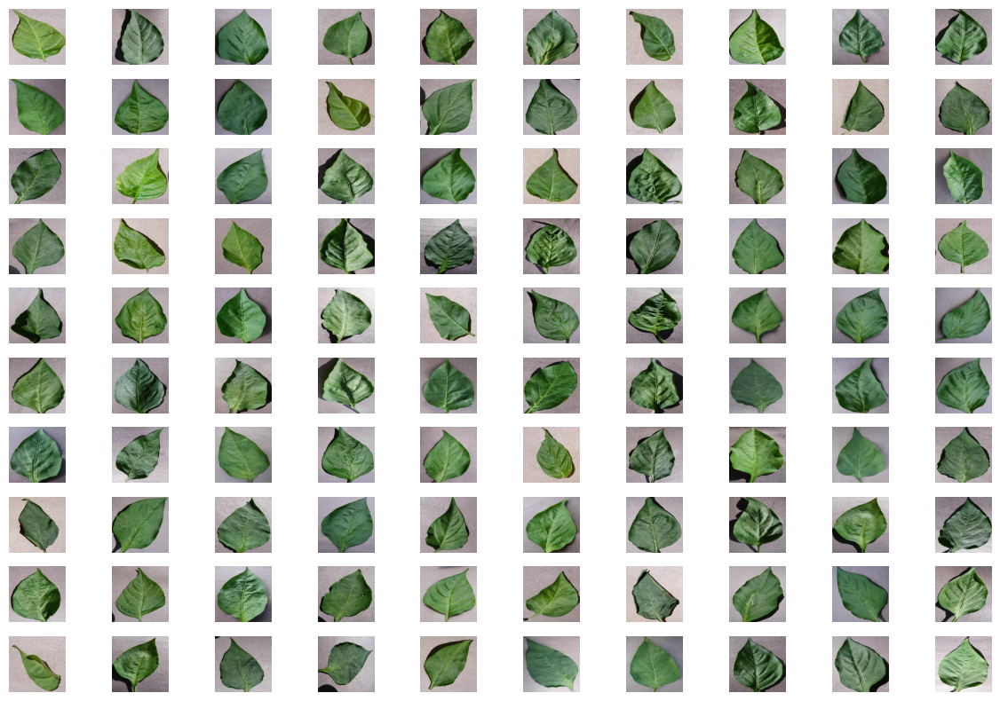

All images resized and displayed in a 3x4 matrix.


In [ ]:
import os
import zipfile
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the path to the zip file
zip_file_path = '/content/drive/MyDrive/Copy of PlantVillage - Copy.zip' # Update with your zip file path

# Define the path to the folder where you want to save the resized images
output_folder = '/content/resized_images/'  # Update with your desired output folder path
os.makedirs(output_folder, exist_ok=True)

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(output_folder)

# Function to resize an image
def resize_image(input_path, size=(128, 128)):
    try:
        image = Image.open(input_path)
        resized_image = image.resize(size, Image.ANTIALIAS)
        return resized_image
    except Exception as e:
        print(f"Error resizing {input_path}: {str(e)}")
        return None

# Create a list to store resized images
resized_images = []

# Loop through the images in the folder, resize them, and add them to the list
for root, dirs, files in os.walk(output_folder):
    for file in files:
        if file.endswith(('.JPG', '.jpeg', '.png', '.bmp')):
            input_path = os.path.join(root, file)
            resized_img = resize_image(input_path, size=(256, 256))  # Update the desired size
            if resized_img:
                resized_images.append(resized_img)

# Define the number of rows and columns for the grid
num_rows = 10
num_columns = 10

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 8))

# Loop through the resized images and display them in the grid
for i in range(num_rows):
    for j in range(num_columns):
        index = i * num_columns + j
        if index < len(resized_images):
            axes[i, j].imshow(resized_images[index])
            axes[i, j].axis('off')  # Turn off axis labels

# Adjust spacing between subplots
plt.tight_layout()

# Display the grid of images
plt.show()

print("All images resized and displayed in a 3x4 matrix.")










**Cleaning images(removing noise)**

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Path to the folder containing your images
input_folder = '/content/resized_images/'

# Path to the folder where cleaned images will be saved
output_root_folder = 'cleaned_images/'

# Function to remove noise from an image using Gaussian blur
def remove_noise(image_path, output_path, kernel_size=(5, 5)):
    image = cv2.imread(image_path)
    # Apply Gaussian blur to the image to remove noise
    blurred = cv2.GaussianBlur(image, kernel_size, 0)
    # Save the cleaned image to the output path
    cv2.imwrite(output_path, blurred)

# Loop through all subdirectories and files in the input folder
for root, dirs, files in os.walk(input_folder):
    for filename in files:
        if filename.endswith(('.JPG', '.jpeg', '.png', '.bmp')):  # Adjust the file extensions as needed
            input_path = os.path.join(root, filename)
            relative_path = os.path.relpath(input_path, input_folder)
            output_path = os.path.join(output_root_folder, relative_path)

            # Create the output folder if it doesn't exist
            os.makedirs(os.path.dirname(output_path), exist_ok=True)

            # Remove noise and save the cleaned image to the corresponding output folder
            remove_noise(input_path, output_path)



print("Noise removal and display completed.")


Noise removal and display completed.


**Cleaning images (removing images) in rows n cols**

**Displaying 10 Cleaned Images**

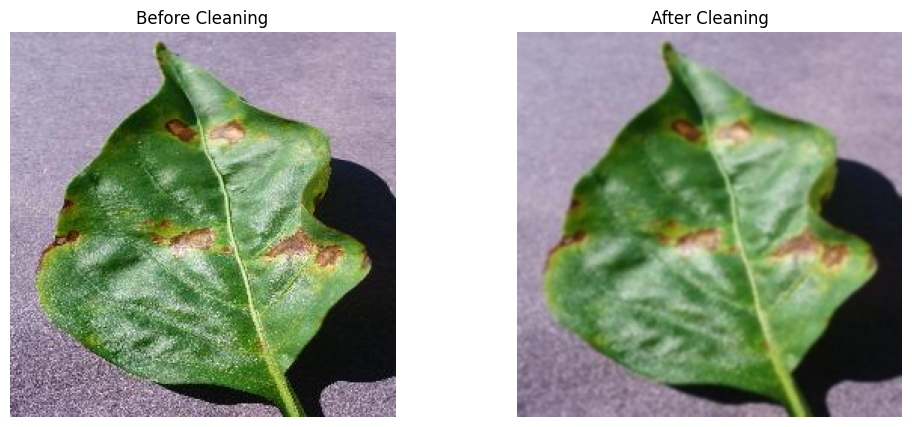

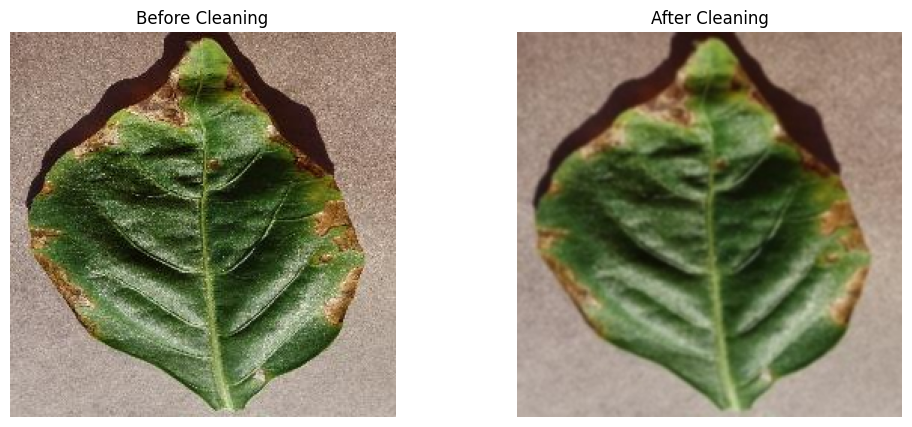

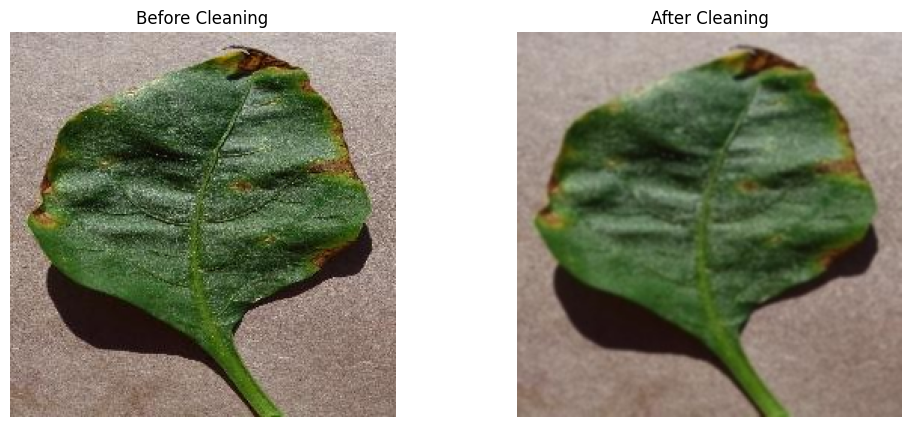

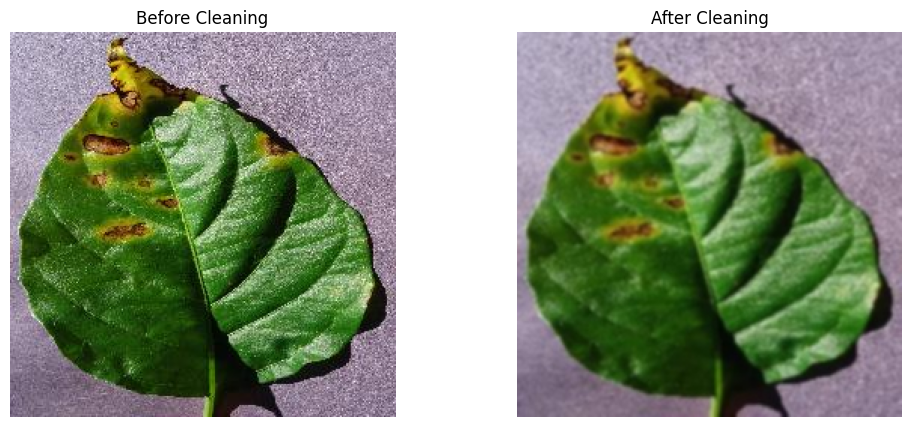

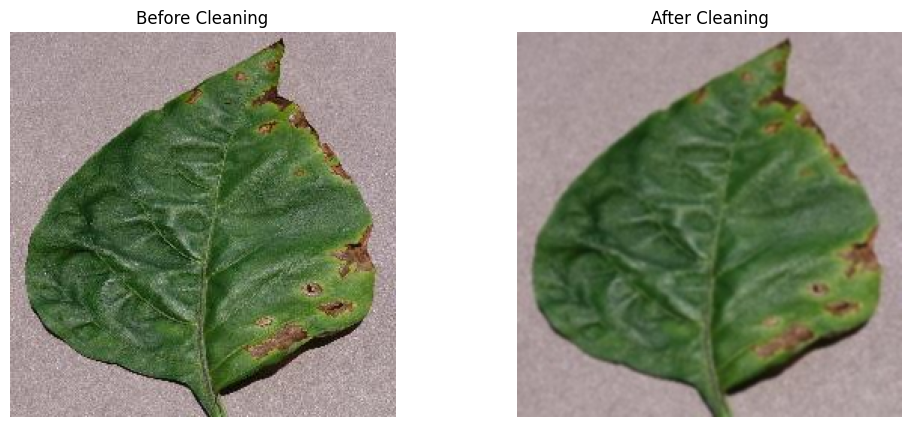

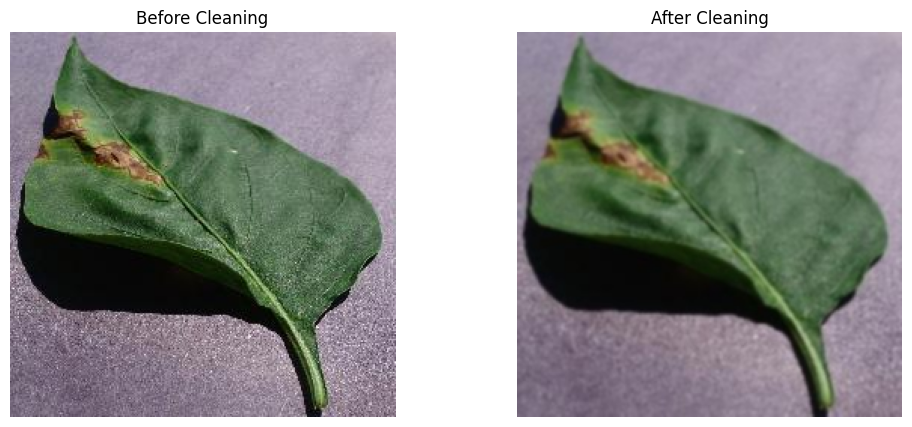

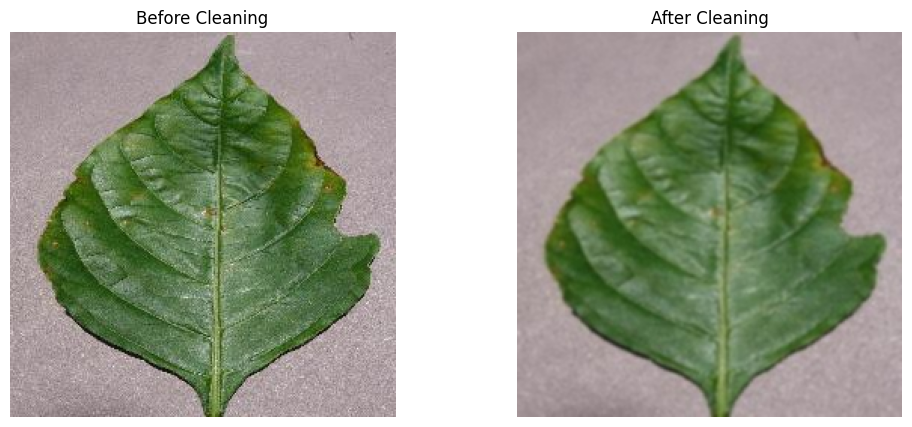

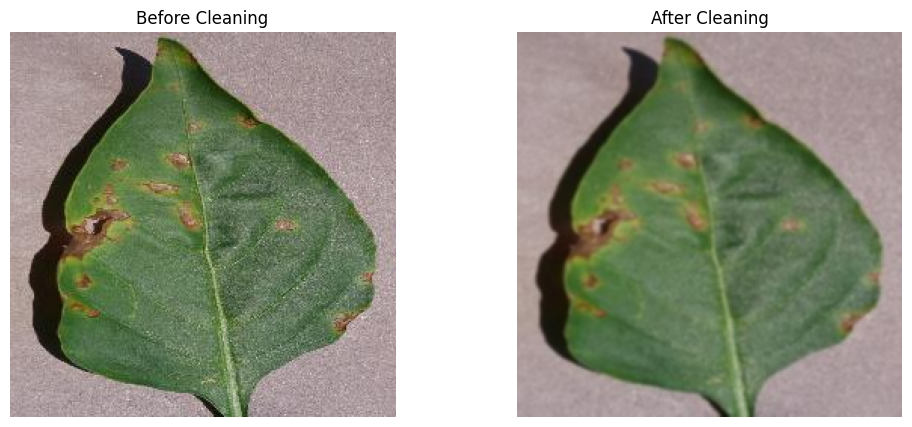

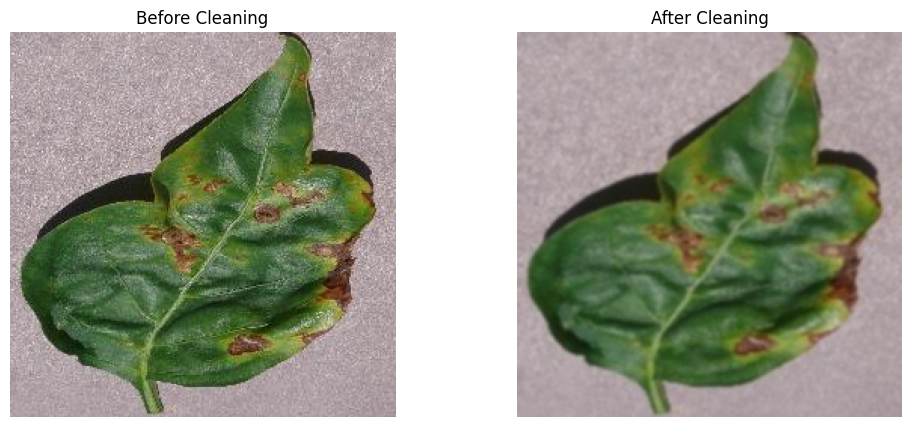

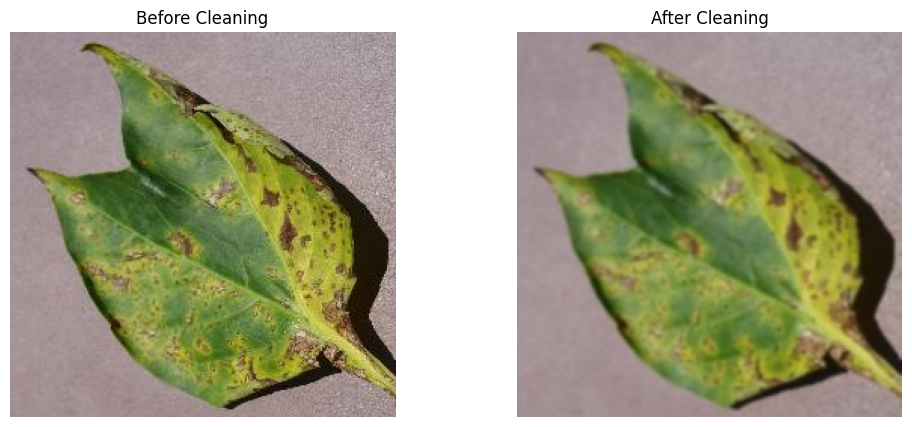

In [ ]:

#display 10 images
import cv2
import os
import matplotlib.pyplot as plt

# Function to remove noise from an image using Gaussian blur
def remove_noise(image_path, output_path, kernel_size=(5, 5)):
    image = cv2.imread(image_path)
    # Apply Gaussian blur to the image to remove noise
    blurred = cv2.GaussianBlur(image, kernel_size, 0)
    # Save the cleaned image to the output path
    cv2.imwrite(output_path, blurred)

# Function to display two images side by side with labels
def display_images_side_by_side(image_path_1, image_path_2, label_1, label_2):
    # Read the original images
    image_1 = cv2.imread(image_path_1)
    image_2 = cv2.imread(image_path_2)

    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Display the first image
    axes[0].imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    axes[0].set_title(label_1)
    axes[0].axis('off')

    # Display the second image
    axes[1].imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    axes[1].set_title(label_2)
    axes[1].axis('off')

    # Show the images
    plt.show()

# Input folder paths
input_folder_1 = '/content/resized_images/PlantVillage - Copy/train/Pepper__bell___Bacterial_spot'
input_folder_2 = '/content/cleaned_images/PlantVillage - Copy/train/Pepper__bell___Bacterial_spot'

# Counter to limit the display to 10 images
image_count = 0

# Process and display images from both directories, limiting to 10 images
for filename in os.listdir(input_folder_1):
    if filename.endswith(('.JPG', '.jpeg', '.png', '.bmp')) and image_count < 10:  # Adjust the file extensions as needed
        input_path_1 = os.path.join(input_folder_1, filename)
        input_path_2 = os.path.join(input_folder_2, filename)

        # Define labels for the images
        label_1 = "Before Cleaning"
        label_2 = "After Cleaning"

        # Display images side by side with labels
        display_images_side_by_side(input_path_1, input_path_2, label_1, label_2)

        image_count += 1  # Increment the image count

        # If 10 images have been displayed, break out of the loop
        if image_count == 10:
            break


**BackGround Removal**

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

# Path to the folder containing your images
input_folder = '/content/cleaned_images/'

# Path to the folder where cleaned images with background removed will be saved
output_root_folder = 'background_removed_images/'  # Adjust the path accordingly

# Function to remove the background using GrabCut
def remove_background(image_path, output_path):
    # Load the image
    image = cv2.imread(image_path)

    # Create a mask to specify the background and foreground regions
    mask = np.zeros(image.shape[:2], np.uint8)

    # Define the rectangle around the object (leaf)
    rect = (10, 10, image.shape[1] - 20, image.shape[0] - 20)

    # Initialize the background and foreground models
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)

    # Apply GrabCut algorithm to segment the object from the background
    cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

    # Create a mask where the foreground and probably foreground pixels are labeled as 1, others as 0
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    # Multiply the original image with the mask to remove the background
    result = image * mask2[:, :, np.newaxis]

    # Save the image with the background removed
    cv2.imwrite(output_path, result)

# Specify the subdirectory you want to process (e.g., "train")
subdirectory_to_process = "PlantVillage - Copy/train"

# Define the full path of the subdirectory within the input folder
input_subfolder = os.path.join(input_folder, subdirectory_to_process)

# Loop through all files in the specified subdirectory
for root, dirs, files in os.walk(input_subfolder):
    for filename in files:
        if filename.endswith(('.JPG', '.jpeg', '.png', '.bmp')):  # Adjust the file extensions as needed
            input_path = os.path.join(root, filename)
            relative_path = os.path.relpath(input_path, input_folder)
            output_path = os.path.join(output_root_folder, relative_path)

            # Create the output folder if it doesn't exist
            os.makedirs(os.path.dirname(output_path), exist_ok=True)

            # Remove the background and save the cleaned image to the corresponding output folder
            remove_background(input_path, output_path)

print(f"Background removal completed for the '{subdirectory_to_process}' subdirectory.")


Background removal completed for the 'PlantVillage - Copy/train' subdirectory.


**Displaying Background Removed Images**

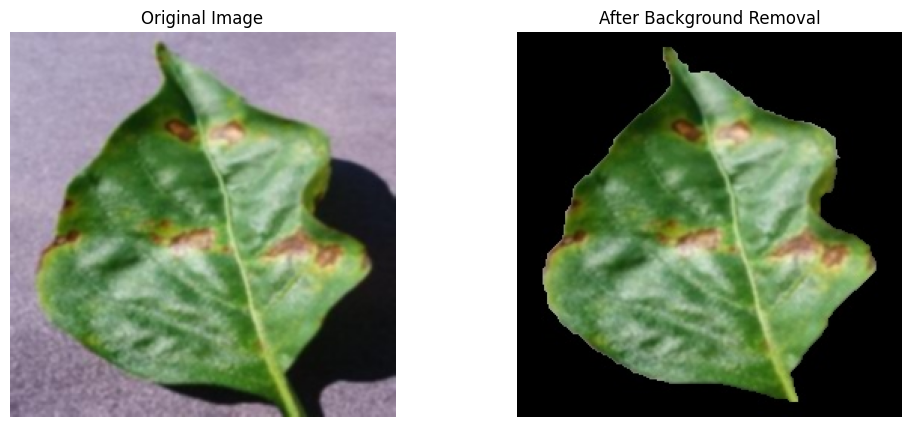

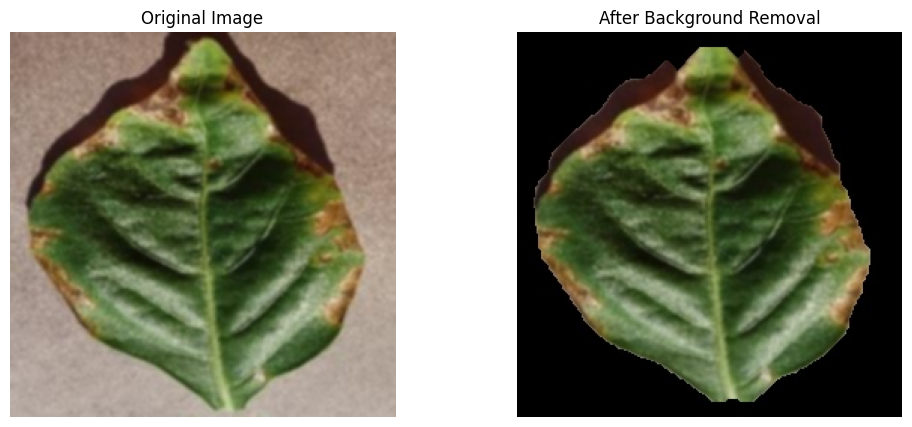

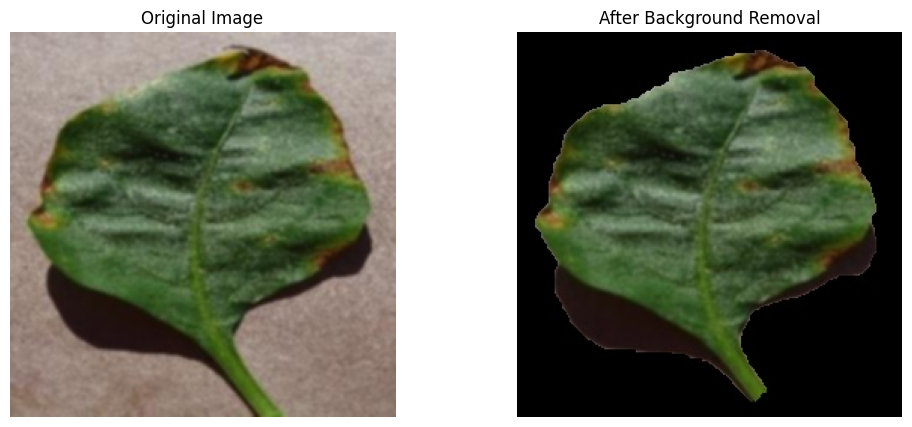

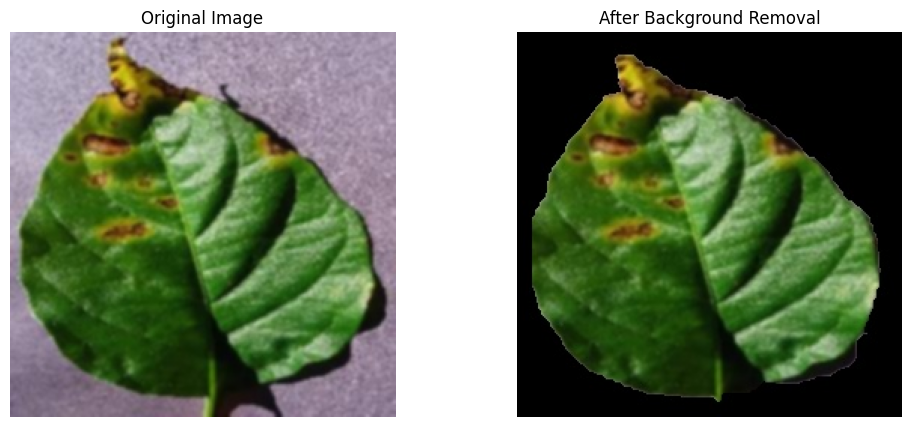

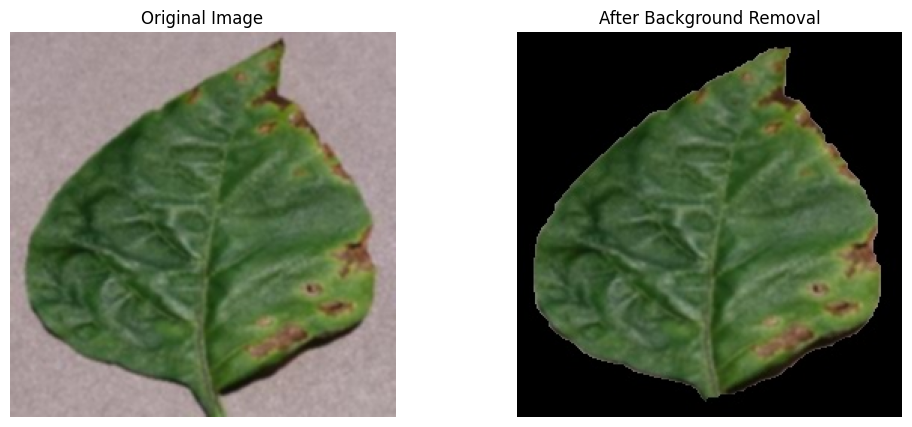

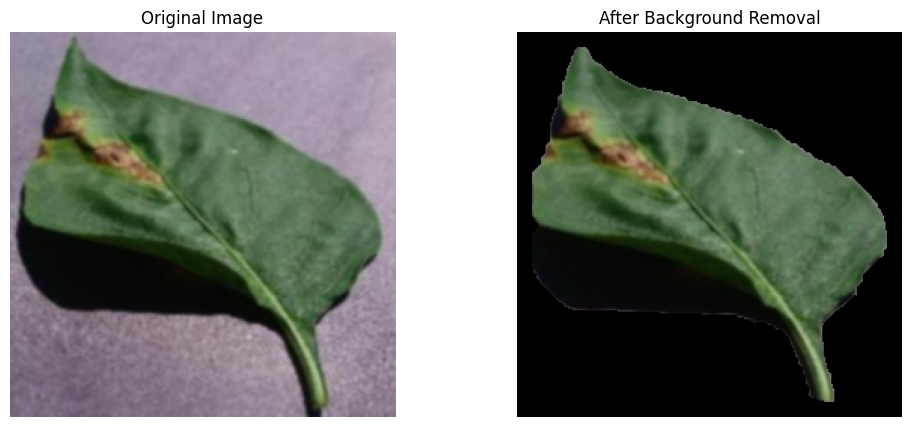

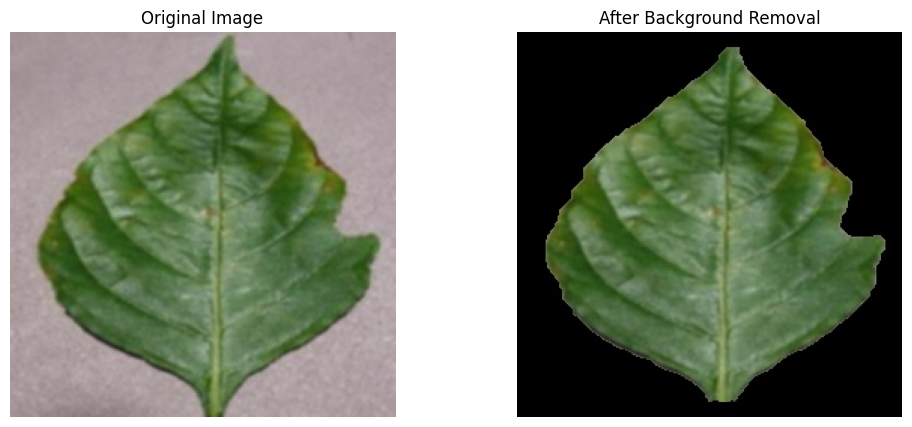

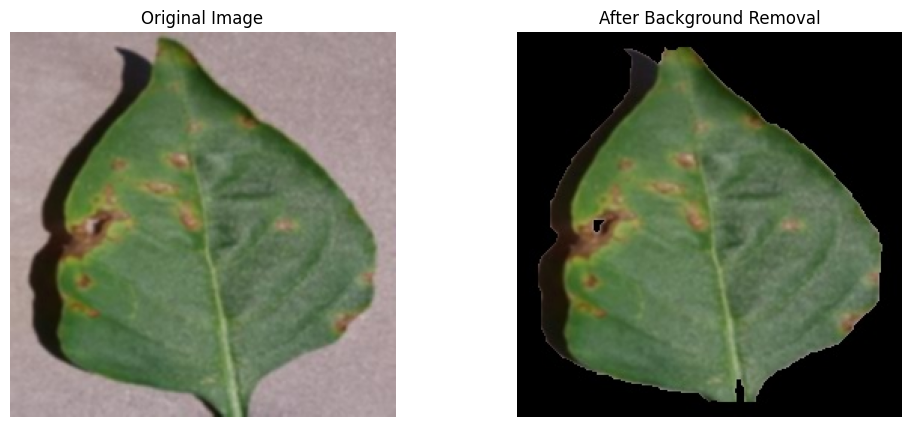

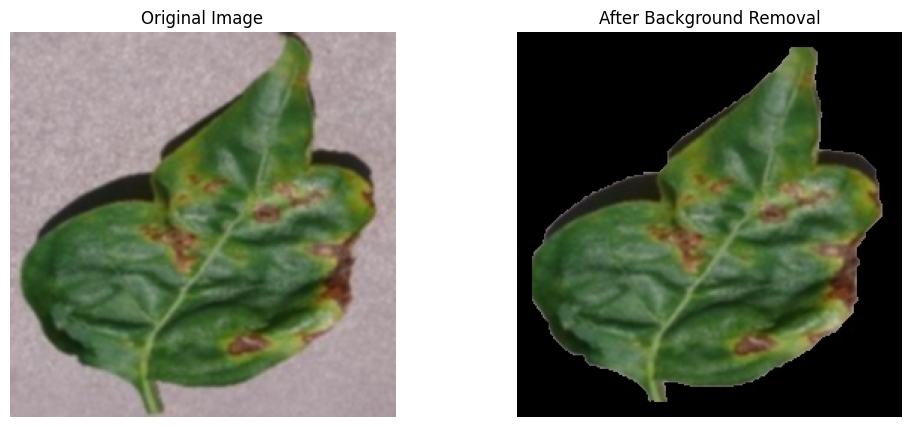

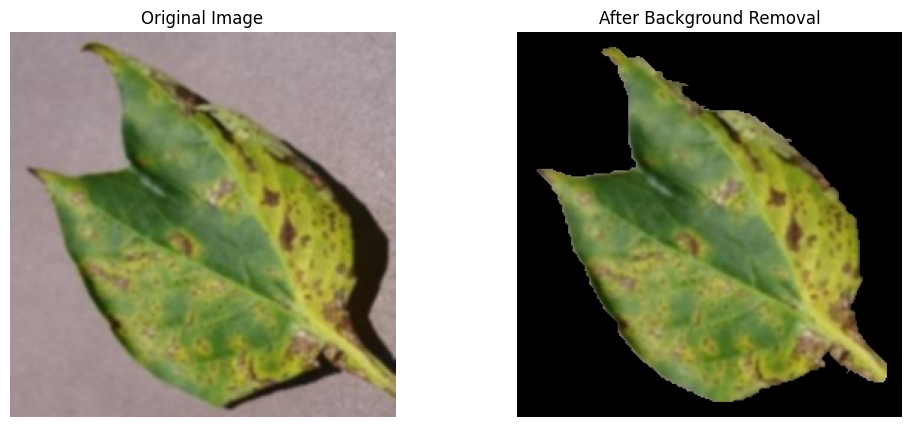

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Function to display two images side by side with labels
def display_images_side_by_side(image_path_1, image_path_2, label_1, label_2):
    # Read the original images
    image_1 = cv2.imread(image_path_1)
    image_2 = cv2.imread(image_path_2)

    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Display the first image
    axes[0].imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    axes[0].set_title(label_1)
    axes[0].axis('off')

    # Display the second image
    axes[1].imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    axes[1].set_title(label_2)
    axes[1].axis('off')

    # Show the images
    plt.show()

# Input folder paths
input_folder_1 = '/content/cleaned_images/PlantVillage - Copy/train/Pepper__bell___Bacterial_spot'
input_folder_2 = '/content/background_removed_images/PlantVillage - Copy/train/Pepper__bell___Bacterial_spot'  # Adjust the path accordingly

# Counter to limit the display to 10 images
image_count = 0

for filename in os.listdir(input_folder_1):
    if filename.endswith(('.JPG', '.jpeg', '.png', '.bmp')) and image_count < 10:  # Adjust the file extensions as needed
        input_path_1 = os.path.join(input_folder_1, filename)
        input_path_2 = os.path.join(input_folder_2, filename)

        # Define labels for the images
        label_1 = "Original Image"
        label_2 = "After Background Removal"

        # Display images side by side with labels
        display_images_side_by_side(input_path_1, input_path_2, label_1, label_2)

        image_count += 1  # Increment the image count

        # If 10 images have been displayed, break out of the loop
        if image_count == 10:
            break


**Detection Part**

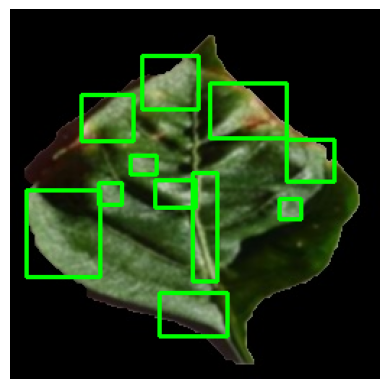

In [ ]:
# Function to detect and display spots on a leaf
def detect_spots(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to create a binary image
    _, binary_image = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Define a minimum area threshold to filter small contours (adjust as needed)
    min_area = 50

    # Iterate over detected contours
    for contour in contours:
        # Calculate the area of the contour
        area = cv2.contourArea(contour)

        if area > min_area:
            # Get the coordinates of the bounding rectangle for the contour
            x, y, w, h = cv2.boundingRect(contour)

            # Draw a green square around the detected spot
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Display the image with squares around the detected spots
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Example usage
image_path = '/content/background_removed_images/PlantVillage - Copy/train/Pepper__bell___Bacterial_spot/2c13c040-2ce6-47c5-899c-8146cd774f79___NREC_B.Spot 1976.JPG'
detect_spots(image_path)

**MobileNet Model**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import keras
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.applications.mobilenet import MobileNet, preprocess_input
from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Data Preparation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

batch_size = 32
train_dir = '/content/PlantVillage - Copy/train'

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # MobileNet's default input size
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Load pre-trained MobileNet model
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers for classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)  # Add more dense layers if needed
predictions = Dense(11, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
es = EarlyStopping(monitor='val_accuracy', min_delta=0.01, patience=3, verbose=1)
mc = ModelCheckpoint(filepath='best_model.h5', monitor='val_accuracy', min_delta=0.01, patience=3, verbose=1, save_best_only=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=20,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    callbacks=[es, mc]
)

# Load the best model
model.load_weights('best_model.h5')


Found 11217 images belonging to 11 classes.
Found 2800 images belonging to 11 classes.
17225924/17225924 [==============================] - 0s 0us/step
Epoch 1/20
350/350 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.9054
Epoch 1: val_accuracy improved from -inf to 0.85022, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


350/350 [==============================] - 220s 579ms/step - loss: 0.3112 - accuracy: 0.9054 - val_loss: 0.5394 - val_accuracy: 0.8502
Epoch 2/20
350/350 [==============================] - ETA: 0s - loss: 0.1504 - accuracy: 0.9505
Epoch 2: val_accuracy did not improve from 0.85022
350/350 [==============================] - 199s 568ms/step - loss: 0.1504 - accuracy: 0.9505 - val_loss: 0.8134 - val_accuracy: 0.8254
Epoch 3/20
350/350 [==============================] - ETA: 0s - loss: 0.1223 - accuracy: 0.9602
Epoch 3: val_accuracy improved from 0.85022 to 0.95905, saving model to best_model.h5
350/350 [==============================] - 196s 561ms/step - loss: 0.1223 - accuracy: 0.9602 - val_loss: 0.1305 - val_accuracy: 0.9591
Epoch 4/20
350/350 [==============================] - ETA: 0s - loss: 0.1017 - accuracy: 0.9683
Epoch 4: val_accuracy did not improve from 0.95905
350/350 [==============================] - 196s 560ms/step - loss: 0.1017 - accuracy: 0.9683 - val_loss: 0.2337 - val_a

In [ ]:
from keras.models import load_model

model = load_model('/content/best_model.h5')


In [ ]:
train_datagen = ImageDataGenerator(
    zoom_range=0.5,
    shear_range=0.1,
    rescale=1/255,
    horizontal_flip=True,
    preprocessing_function=lambda img: img * 1.2  # Adjust the factor as needed
)
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [ ]:
train = train_datagen.flow_from_directory(directory="/content/PlantVillage - Copy/train",target_size=(256,256),batch_size=32)

val = val_datagen.flow_from_directory(directory="/content/PlantVillage - Copy/test" ,target_size=(256,256),batch_size=32)

Found 14017 images belonging to 11 classes.
Found 2206 images belonging to 11 classes.


In [ ]:
t_img,label=train.next()

In [ ]:
t_img.shape

(32, 256, 256, 3)

In [ ]:
def plotImage(img_arr,label):
  for im , l in zip(img_arr,label):
    plt.figure(figsize=(5,5))
    plt.imshow(im)
    plt.show()

In [ ]:
plotImage(t_img[:3],label[:3])

In [ ]:
ref = dict(zip(list(train.class_indices.values()),list(train.class_indices.keys())))

In [ ]:
def prediction(path):
  img = load_img(path,target_size=(224,224))
  i= img_to_array(img)
  im = preprocess_input(i)
  img = np.expand_dims(im,axis=0)
  pred = np.argmax(model.predict(img))
  print(f"The Predicted image belong to {ref[pred]}")

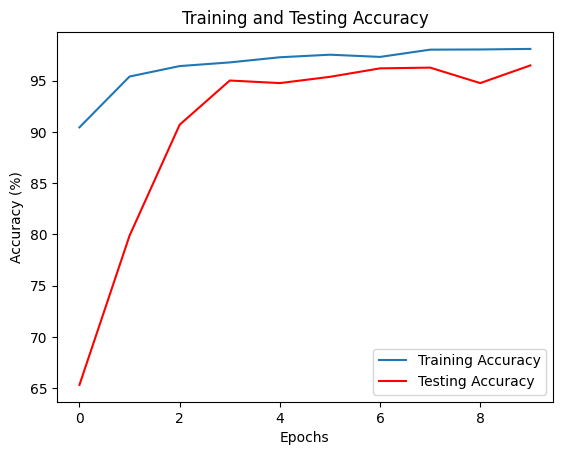

In [ ]:
# After training the model with model.fit, you can access the accuracy history
train_accuracy = [acc * 100 for acc in history.history['accuracy']]
val_accuracy = [acc * 100 for acc in history.history['val_accuracy']]

# Plot the accuracy curves
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Testing Accuracy', c='red')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.title('Training and Testing Accuracy')
plt.show()


In [ ]:
# After training the model with model.fit, you can access the accuracy history
train_accuracy = history.history['accuracy'][-1]  # Get the final training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Get the final validation accuracy

# Convert accuracy values to percentages and print
train_accuracy_percent = train_accuracy * 100
val_accuracy_percent = val_accuracy * 100

print(f"The accuracy of your model is: Training {train_accuracy_percent:.2f}%, Testing {val_accuracy_percent:.2f}%")


The accuracy of your model is: Training 98.09%, Testing 96.48%


1/1 [==============================] - 0s 20ms/step
The Predicted image belong to Pepper__bell___Bacterial_spot


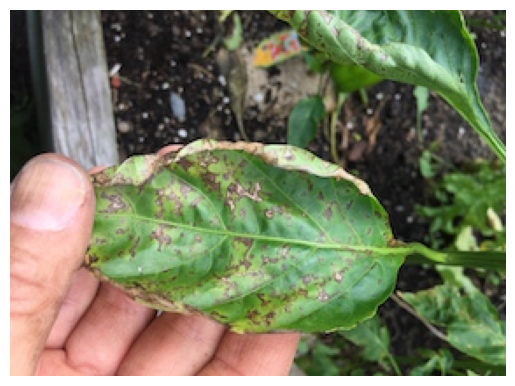

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Function to make a prediction and display the image with the predicted class
def prediction_and_display(image_path):
    # Load and display the image
    image = cv2.imread(image_path)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Make your prediction here (you need to implement the prediction part)
    predicted_class = prediction(image_path)

    # Show the image with the predicted class
    plt.axis('off')  # Hide axis labels and ticks
    plt.show()

# Example usage
image_path = '/content/BLS-on-pepper.jpg'
prediction_and_display(image_path)
